## EDA - Dataset 12 - airbnb_open_data

### 1. Packages & Settings


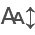

In [1]:
# Core libraries
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
%matplotlib inline

# Advanced analysis
from scipy import stats
from ydata_profiling import ProfileReport

# Interactive tables (optional)
from itables import init_notebook_mode, show
init_notebook_mode(all_interactive=True)

# Configuration
pd.set_option('display.max_columns', 30)
sns.set_theme(style='whitegrid')
%config InlineBackend.figure_format = 'retina'
np.random.seed(42)  # Reproducibility

### 2. Importing Data

In [2]:
# Data Loading
df = pd.read_csv(r"E:\Work\DataSciencePortfolio\0_Data\0.12_airbnb_open_data\0.12.1_Raw\Airbnb_Open_Data.csv")

C:\Users\Administrator\AppData\Local\Temp\ipykernel_5560\167191615.py:2: DtypeWarning: Columns (25) have mixed types. Specify dtype option on import or set low_memory=False.
  df = pd.read_csv(r"E:\Work\DataSciencePortfolio\0_Data\0.1_Raw\0.1.12_airbnb_open_data\Airbnb_Open_Data.csv")


### 3.1 First Look

In [3]:
# Sample data
show(df.sample(5))  # Random rows to avoid bias

# Summary of the DataFrame
df.info()

# Basic Statistics of the DataFrame
df.describe()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 102599 entries, 0 to 102598
Data columns (total 26 columns):
 #   Column                          Non-Null Count   Dtype  
---  ------                          --------------   -----  
 0   id                              102599 non-null  int64  
 1   NAME                            102349 non-null  object 
 2   host id                         102599 non-null  int64  
 3   host_identity_verified          102310 non-null  object 
 4   host name                       102193 non-null  object 
 5   neighbourhood group             102570 non-null  object 
 6   neighbourhood                   102583 non-null  object 
 7   lat                             102591 non-null  float64
 8   long                            102591 non-null  float64
 9   country                         102067 non-null  object 
 10  country code                    102468 non-null  object 
 11  instant_bookable                102494 non-null  object 
 12  cancellation_pol

id       host id            lat           long  \
count  1.025990e+05  1.025990e+05  102591.000000  102591.000000   
mean   2.914623e+07  4.925411e+10      40.728094     -73.949644   
std    1.625751e+07  2.853900e+10       0.055857       0.049521   
min    1.001254e+06  1.236005e+08      40.499790     -74.249840   
25%    1.508581e+07  2.458333e+10      40.688740     -73.982580   
50%    2.913660e+07  4.911774e+10      40.722290     -73.954440   
75%    4.320120e+07  7.399650e+10      40.762760     -73.932350   
max    5.736742e+07  9.876313e+10      40.916970     -73.705220   

       Construction year  minimum nights  number of reviews  \
count      102385.000000   102190.000000      102416.000000   
mean         2012.487464        8.135845          27.483743   
std             5.765556       30.553781          49.508954   
min          2003.000000    -1223.000000           0.000000   
25%          2007.000000        2.000000           1.000000   
50%          2012.000000        3.000000           7.000000   
75%          2017.000000        5.000000          30.000000   
max          2022.000000     5645.000000        1024.000000   

       reviews per month  review rate number  calculated host listings count  \
count       86720.000000       102273.000000                   102280.000000   
mean            1.374022            3.279106                        7.936605   
std             1.746621            1.284657                       32.218780   
min             0.010000            1.000000                        1.000000   
25%             0.220000            2.000000                        1.000000   
50%             0.740000            3.000000                        1.000000   
75%             2.000000            4.000000                        2.000000   
max            90.000000            5.000000                      332.000000   

       availability 365  
count     102151.000000  
mean         141.133254  
std          135.435024  
min          -10.000000  
25%            3.000000  
50%           96.000000  
75%          269.000000  
max         3677.000000

### 3.2 Results of First Look:
##### Observations:
- large sized dataframe (102599 x 26)
- There are missing values in every column **except**: id, host id, room type.
- Data types look terrible, **adjustments needed**: construction year, price, service fee, minimum nights, number of reviews, last review, calculated host listings count, availability 365
##### Potential Problems:
- Very unclean data, hard to analyze reasonable results with so many flaws.
- Strings probably need cleaning too, looks very messy, extremely lengthy names/house rules.
- Potentially irrelevant columns.

### 4.1 Automated Analysis with ydata_profiling

In [4]:
# profile = ProfileReport(df, title="Automated EDA", explorative=True)
# profile.to_notebook_iframe()
# Save to HTML for later review (optional)
# profile.to_file("5.1.12b_automated_eda_report.html")

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

100%|██████████| 26/26 [00:00<00:00, 28.36it/s]


Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

Export report to file:   0%|          | 0/1 [00:00<?, ?it/s]

### 4.2 Automated EDA Results
##### Observations
- id and host id not fully distinct == duplicates.
- many irrelevant columns

##### Hypotheses:
- Correlations: lat/long => neighbourhoods. Makes sense
- Correlations: Too many minimum nights => Less reviews => Maybe less likable.

### 5. Necessary Cleaning & Transformation Steps for Python Scripts
##### Cleaning:
- Entire dataset needs cleaning, many columns need a closer look, potentially removal.
- Strings need cleaning
- Datatypes need optimization
##### Transformation:
- A lot of cleaning to do, focus on transformation after.

### 6. Hypothesis-Driven Analysis

In [5]:
# Check hypotheses in 4.2

### 7. Focused Investigation
*When to use*:  
- Drill into subgroups (e.g., "Why do users aged 30-40 have higher churn?")  
- Export specific slices for stakeholder reviews  
*Industry Standard*: Never explore blindly – start with hypotheses from Sections 4-5.

In [6]:
# Check how hyptheses from 3-5 can be explained by the data
"""
show(
    df.query("Income > 70000"),
    column_filters="footer",
    buttons=["copy", "csv"],
    scrollY="300px",
    classes="compact"
)
"""

'\nshow(\n    df.query("Income > 70000"),\n    column_filters="footer",\n    buttons=["copy", "csv"],\n    scrollY="300px",\n    classes="compact"\n)\n'